Sizlere bir ağ trafiği verisi sunuyoruz. Bu veride hem meşru trafik hem de saldırı trafiği bulunmaktadır. Göreviniz, bu veriyi analiz etmek ve genel trafiği görselleştirmek için uygun yöntemleri kullanmaktır. Örnek olarak, içten içe ve içten dışa trafiğin yoğunluğunu belirlemek, en çok trafik yapan ve en çok veri indiren adresleri tespit etmek gibi durumları göz önünde bulundurabilirsiniz. Ayrıca, bu trafik verisi üzerinden bazı yaygın siber saldırıları tespit etmek de beklenmektedir.

 

İşte görevinizde yardımcı olabilecek bazı adımlar:

 

Veri Keşfi ve Temizleme: İlk adım olarak, veri setini inceleyiniz ve gerekiyorsa temizleyiniz. Anlamlı verileri ayıklamak ve anormallikleri tespit etmek için görselleştirmeler yapılmalıdır.

Trafik Analizi: Veri setini ayrıntılı olarak analiz edin. İçten içe ve içten dışa trafiği belirleyin, en yoğun zaman dilimlerini ve trafik kaynaklarını belirleyin.

Görselleştirme: Analiz sonuçlarını görselleştirerek sunum yapınız. Grafikler, tablolar gibi görsel araçları kullanarak trafiği anlamak ve sunmak daha etkili olabilir.

Siber Saldırı Tespiti: Port taraması, Bruteforce saldırıları ve ARP Scan, Exfiltration, Execution gibi siber saldırıları belirlemek için veriyi inceleyiniz. Bu saldırıları gerçekleştiren IP adreslerini ve hedef IP adreslerini tespit ediniz. Ayrıca, saldırıların zamanını da analiz ediniz.

Raporlama: Analiz sonuçlarını içeren kapsamlı bir rapor hazırlayınız. Raporunuzda, kullanılan metodolojiyi, bulguları ve tavsiyelerinizi açıkça belirtmeniz istenmektedir.

 

Bu case ile ilgili çalışırken Python kullanmayı ve kaynak kodlarınızı da paylaşmayı unutmayınız. Bu case için geri dönüş süresi 1 haftadır. Tüm adımların tamamlanması şart değildir.  

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
pd.set_option('display.max_columns',None)

In [3]:
df = pd.read_csv(r'C:\Users\manai\Desktop\NextRay\ds_mulakat.csv')

C:\Users\manai\AppData\Local\Temp\ipykernel_4920\1748734204.py:1: DtypeWarning: Columns (102,116) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(r'C:\Users\manai\Desktop\NextRay\ds_mulakat.csv')


In [6]:
df1 = df.copy()

In [7]:
df.head()

,sync_name,source_address,destination_address,source_port,destination_port,protocol,app_protocol,application_name,application_category_name,master_application_name,tunnel_source_address,tunnel_destination_address,source_mac,destination_mac,tunnel_value,package_count,login_fail_count,login_success,expiration_id,drop_eligible,priority,vlan_identifier,event_time,bidirectional_first_seen_ms,bidirectional_last_seen_ms,bidirectional_duration_ms,bidirectional_bytes,bidirectional_max_piat_ms,bidirectional_max_ps,bidirectional_mean_piat_ms,bidirectional_mean_ps,bidirectional_min_piat_ms,bidirectional_min_ps,bidirectional_packets,bidirectional_stddev_piat_ms,bidirectional_stddev_ps,bidirectional_syn_packets,bidirectional_cwr_packets,bidirectional_ece_packets,bidirectional_urg_packets,bidirectional_ack_packets,bidirectional_psh_packets,bidirectional_rst_packets,bidirectional_fin_packets,src2dst_first_seen_ms,src2dst_last_seen_ms,src2dst_duration_ms,src2dst_packets,src2dst_bytes,src2dst_max_piat_ms,src2dst_max_ps,src2dst_mean_piat_ms,src2dst_mean_ps,src2dst_min_piat_ms,src2dst_min_ps,src2dst_stddev_piat_ms,src2dst_stddev_ps,src2dst_syn_packets,src2dst_cwr_packets,src2dst_ece_packets,src2dst_urg_packets,src2dst_ack_packets,src2dst_psh_packets,src2dst_rst_packets,src2dst_fin_packets,dst2src_first_seen_ms,dst2src_last_seen_ms,dst2src_duration_ms,dst2src_packets,dst2src_bytes,dst2src_max_piat_ms,dst2src_max_ps,dst2src_mean_piat_ms,dst2src_mean_ps,dst2src_min_piat_ms,dst2src_min_ps,dst2src_stddev_piat_ms,dst2src_stddev_ps,dst2src_syn_packets,dst2src_cwr_packets,dst2src_ece_packets,dst2src_urg_packets,dst2src_ack_packets,dst2src_psh_packets,dst2src_rst_packets,dst2src_fin_packets,is_username,username,username_arr,is_hostname,source_hostname,source_hostname_arr,destination_hostname,destination_hostname_arr,domain,domain_arr,dns_query_name,dns_query_len,dns_query_type,dns_answer_name,dns_answer_len,dns_answer_type,dns_answer_addresses,dns_not_exist,dns_server_direction,dns_query_main_domain,dns_query_sub_domain,dns_query_has_sub_domain,DNS,status,status_code,request_host,request_type,request_uri,request_uri_arr,user_agent,first_http_post_body,http_request,bidirectional_http_request_count,bidirectional_get_request_count,bidirectional_get_request_bytes,bidirectional_post_request_count,bidirectional_post_request_bytes,src2dst_get_request_bytes,src2dst_post_request_bytes,dst2src_get_request_bytes,dst2src_post_request_bytes,HTTP,ja3_client,ja3_server,mail_sender,mail_recipient,file_transport,ntlmssp_auth_seen,LdapUserInfo,ICMP,SMB2Status,Flow_Risks,Kerberos,server_side_using_capability,UserBehavior,personnel_info,DeviceOnNetwork,direction,day,day_of_week,hour_of_day,location_id,bidirectional_first_seen_ms_ts,bidirectional_last_seen_ms_ts,sourceCountry,destinationCountry,sourceGeoPoint,destinationGeoPoint,src_asn,dst_asn,nbns_conflict_count,ndr_name,source_type,destination_type,session_id,session_id_from_time,protocol_name,source_asset_type,destination_asset_type,minutes
0,master-node,192.168.2.100,192.168.0.1,0,0,0,1000,ARP-Request,ARP,ARP,NaN,NaN,00:50:56:a6:4d:5e,ff:ff:ff:ff:ff:ff,0,1,0,0,0,False,0,0,2024-03-18 14:07:19.738372034+00:00,1710770835765056,1710770835765056,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0.0,0,0,0,0,0,0,0,0,False,NotFound,[''NotFound''],False,exc03,[''\x12\x04\x10exc03''],192.168.0.1,NaN,NotFound,[''NotFound''],NaN,0,NaN,NaN,0,NaN,NaN,0,NaN,NaN,NaN,0,"{''large_package_count'': 0, ''dns_query_count...",NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,{''reversed'': False},NaN,NaN,NotFound,NaN,False,False,"{''user_name'': '''', ''title_name'': '''', ''...","{''icmp_type_code'': 0, ''icmp_type'': 0, ''ic...","{''smb2message_id'': None, ''smb2file_message_...","{''risk'': '''', ''risk_severity'': '''', ''ri...","{''auth_service_status'': False, ''tag_status'...",NaN,"{''type'': ''Internal'', ''country'': '''', ''...","{''department'': '''', ''title'': ''

In [11]:
for i in df.columns:
    if len(df[i].value_counts().index)<20:
        print(df[i].value_counts())

master-node    160983
Name: sync_name, dtype: int64
6      90894
17     58185
0      11478
1        414
2          6
112        6
Name: protocol, dtype: int64
Unknown    125291
DNS         21315
ARP         11478
NetBIOS      2144
TLS           456
QUIC          242
HTTP           54
STUN            3
Name: master_application_name, dtype: int64
Series([], Name: tunnel_source_address, dtype: int64)
Series([], Name: tunnel_destination_address, dtype: int64)
2     136834
30     12671
0      11478
Name: tunnel_value, dtype: int64
0    159838
1      1145
Name: login_fail_count, dtype: int64
0    156984
1      3999
Name: login_success, dtype: int64
0    158610
1      2373
Name: expiration_id, dtype: int64
False    160983
Name: drop_eligible, dtype: int64
0    160983
Name: priority, dtype: int64
0    160983
Name: vlan_identifier, dtype: int64
0     73492
2     58053
4     26994
1      1037
8       602
5       329
6       227
7       138
3       101
12        7
9         2
10        1
Name: bi

{''AsnCode'': 0, ''AsnOrganizationName'': ''''}         159845
{''AsnCode'': 0, ''AsnOrganizationName'': ''EMPTY''}      1138
Name: src_asn, dtype: int64
{''AsnCode'': 0, ''AsnOrganizationName'': ''''}         146276
{''AsnCode'': 0, ''AsnOrganizationName'': ''EMPTY''}     14707
Name: dst_asn, dtype: int64
0    160983
Name: nbns_conflict_count, dtype: int64
Series([], Name: ndr_name, dtype: int64)
INTERNAL    159845
EXTERNAL      1138
Name: source_type, dtype: int64
INTERNAL    146276
EXTERNAL     14707
Name: destination_type, dtype: int64
TCP     90894
UDP     58185
ARP     11478
ICMP      414
IGMP        6
VRRP        6
Name: protocol_name, dtype: int64
Series([], Name: source_asset_type, dtype: int64)
Series([], Name: destination_asset_type, dtype: int64)


In [9]:
df['sync_name'].value_counts()

master-node    160983
Name: sync_name, dtype: int64

In [10]:
df['source_address'].value_counts()

10.1.66.175       29137
10.1.68.100       27432
10.1.68.210        9145
10.10.100.100      8068
10.1.51.60         4669
                  ...  
10.1.40.206           1
106.53.74.140         1
111.56.54.202         1
109.206.237.58        1
152.32.141.172        1
Name: source_address, Length: 956, dtype: int64

In [13]:
df[['source_address','destination_address']].value_counts()

source_address  destination_address
10.1.68.100     10.10.101.10           14647
10.10.100.100   1.1.1.1                 7768
10.1.66.175     10.1.76.57              5964
                10.1.76.120             4932
10.1.51.60      10.10.100.100           4669
                                       ...  
10.110.10.65    10.10.111.11               1
10.1.77.30      52.179.216.235             1
                20.52.64.200               1
                192.168.30.81              1
95.214.55.244   10.1.71.10                 1
Length: 2989, dtype: int64

In [19]:
df[df['source_address']=='10.10.100.100'].groupby(['source_address','destination_address'])['destination_address'].count()

source_address  destination_address
10.10.100.100   1.0.0.1                  73
                1.1.1.1                7768
                10.1.40.100              47
                10.1.51.60                1
                10.10.100.105            10
                10.10.100.254             1
                10.10.101.10             26
                10.10.110.10              1
                10.10.111.11              2
                10.10.130.13              6
                10.110.10.36              1
                10.110.10.53              1
                10.200.0.200              9
                10.200.0.201              1
                10.212.134.100            6
                10.212.134.120            1
                10.212.134.142            1
                170.247.170.2             4
                172.16.200.100           51
                172.16.200.105            7
                192.112.36.4              6
                192.168.23.27           

In [25]:
df[df['destination_address']=='10.10.100.100'].groupby(['source_address','destination_address'])['destination_address'].count().sort_values(ascending =False)

source_address  destination_address
10.1.51.60      10.10.100.100          4669
10.1.60.241     10.10.100.100          3763
10.212.134.66   10.10.100.100          1937
10.10.114.11    10.10.100.100          1787
10.1.68.103     10.10.100.100           882
                                       ... 
10.80.7.5       10.10.100.100             1
10.1.78.31      10.10.100.100             1
10.29.1.81      10.10.100.100             1
192.168.30.66   10.10.100.100             1
172.16.11.110   10.10.100.100             1
Name: destination_address, Length: 344, dtype: int64

In [27]:
df[df['source_address']=='1.1.1.1']

,sync_name,source_address,destination_address,source_port,destination_port,protocol,app_protocol,application_name,application_category_name,master_application_name,tunnel_source_address,tunnel_destination_address,source_mac,destination_mac,tunnel_value,package_count,login_fail_count,login_success,expiration_id,drop_eligible,priority,vlan_identifier,event_time,bidirectional_first_seen_ms,bidirectional_last_seen_ms,bidirectional_duration_ms,bidirectional_bytes,bidirectional_max_piat_ms,bidirectional_max_ps,bidirectional_mean_piat_ms,bidirectional_mean_ps,bidirectional_min_piat_ms,bidirectional_min_ps,bidirectional_packets,bidirectional_stddev_piat_ms,bidirectional_stddev_ps,bidirectional_syn_packets,bidirectional_cwr_packets,bidirectional_ece_packets,bidirectional_urg_packets,bidirectional_ack_packets,bidirectional_psh_packets,bidirectional_rst_packets,bidirectional_fin_packets,src2dst_first_seen_ms,src2dst_last_seen_ms,src2dst_duration_ms,src2dst_packets,src2dst_bytes,src2dst_max_piat_ms,src2dst_max_ps,src2dst_mean_piat_ms,src2dst_mean_ps,src2dst_min_piat_ms,src2dst_min_ps,src2dst_stddev_piat_ms,src2dst_stddev_ps,src2dst_syn_packets,src2dst_cwr_packets,src2dst_ece_packets,src2dst_urg_packets,src2dst_ack_packets,src2dst_psh_packets,src2dst_rst_packets,src2dst_fin_packets,dst2src_first_seen_ms,dst2src_last_seen_ms,dst2src_duration_ms,dst2src_packets,dst2src_bytes,dst2src_max_piat_ms,dst2src_max_ps,dst2src_mean_piat_ms,dst2src_mean_ps,dst2src_min_piat_ms,dst2src_min_ps,dst2src_stddev_piat_ms,dst2src_stddev_ps,dst2src_syn_packets,dst2src_cwr_packets,dst2src_ece_packets,dst2src_urg_packets,dst2src_ack_packets,dst2src_psh_packets,dst2src_rst_packets,dst2src_fin_packets,is_username,username,username_arr,is_hostname,source_hostname,source_hostname_arr,destination_hostname,destination_hostname_arr,domain,domain_arr,dns_query_name,dns_query_len,dns_query_type,dns_answer_name,dns_answer_len,dns_answer_type,dns_answer_addresses,dns_not_exist,dns_server_direction,dns_query_main_domain,dns_query_sub_domain,dns_query_has_sub_domain,DNS,status,status_code,request_host,request_type,request_uri,request_uri_arr,user_agent,first_http_post_body,http_request,bidirectional_http_request_count,bidirectional_get_request_count,bidirectional_get_request_bytes,bidirectional_post_request_count,bidirectional_post_request_bytes,src2dst_get_request_bytes,src2dst_post_request_bytes,dst2src_get_request_bytes,dst2src_post_request_bytes,HTTP,ja3_client,ja3_server,mail_sender,mail_recipient,file_transport,ntlmssp_auth_seen,LdapUserInfo,ICMP,SMB2Status,Flow_Risks,Kerberos,server_side_using_capability,UserBehavior,personnel_info,DeviceOnNetwork,direction,day,day_of_week,hour_of_day,location_id,bidirectional_first_seen_ms_ts,bidirectional_last_seen_ms_ts,sourceCountry,destinationCountry,sourceGeoPoint,destinationGeoPoint,src_asn,dst_asn,nbns_conflict_count,ndr_name,source_type,destination_type,session_id,session_id_from_time,protocol_name,source_asset_type,destination_asset_type,minutes


In [12]:
df[['source_address','destination_address','minutes']].value_counts()

source_address  destination_address  minutes
10.1.78.24      10.1.78.10           14         1051
10.1.68.100     10.10.101.10         26          942
                                     18          922
                                     24          890
                                     15          883
                                                ... 
10.10.111.11    192.168.63.45        18            1
                                     15            1
                                     12            1
                192.168.63.41        17            1
95.214.55.244   10.1.71.10           25            1
Length: 14698, dtype: int64

In [7]:
list(df.columns)

['sync_name',
 'source_address',
 'destination_address',
 'source_port',
 'destination_port',
 'protocol',
 'app_protocol',
 'application_name',
 'application_category_name',
 'master_application_name',
 'tunnel_source_address',
 'tunnel_destination_address',
 'source_mac',
 'destination_mac',
 'tunnel_value',
 'package_count',
 'login_fail_count',
 'login_success',
 'expiration_id',
 'drop_eligible',
 'priority',
 'vlan_identifier',
 'event_time',
 'bidirectional_first_seen_ms',
 'bidirectional_last_seen_ms',
 'bidirectional_duration_ms',
 'bidirectional_bytes',
 'bidirectional_max_piat_ms',
 'bidirectional_max_ps',
 'bidirectional_mean_piat_ms',
 'bidirectional_mean_ps',
 'bidirectional_min_piat_ms',
 'bidirectional_min_ps',
 'bidirectional_packets',
 'bidirectional_stddev_piat_ms',
 'bidirectional_stddev_ps',
 'bidirectional_syn_packets',
 'bidirectional_cwr_packets',
 'bidirectional_ece_packets',
 'bidirectional_urg_packets',
 'bidirectional_ack_packets',
 'bidirectional_psh_packet

In [8]:
df['tunnel_source_address'].value_counts(dropna =False)

NaN    160983
Name: tunnel_source_address, dtype: int64

In [9]:
df['status'].value_counts(dropna = False)

NaN                          159503
200 OK                          974
401 Unauthorized                180
280 BGB Session Continued       113
201 Created                      94
200                              42
204 No Content                   19
302 Found                        12
304 Not Modified                  8
503 Service Unavailable           8
404 Not Found                     8
400 Bad Request                   6
404                               5
404 Object Not Found              4
206 Partial Content               3
207 Multi-Status                  2
101 Switching Protocols           1
400                               1
Name: status, dtype: int64

In [6]:
df['source_mac'].agg({min,max})

min    00:04:96:f8:0d:f0
max    f8:f2:1e:cd:62:b0
Name: source_mac, dtype: object

In [11]:
df.shape

(160983, 165)

In [4]:
df['event_time'] = pd.to_datetime(df['event_time'])

In [5]:
df['event_time'].agg(['min','max'])

min   2024-03-18 14:07:00.379800817+00:00
max   2024-03-18 14:34:52.013935005+00:00
Name: event_time, dtype: datetime64[ns, UTC]

In [5]:
df['minutes'] = df['event_time'].dt.minute

In [4]:
df['direction'].map({'INTERNAL2INTERNAL':'İÇTEN İÇE', 'INTERNAL2EXTERNAL':'İÇTEN DIŞA','EXTERNAL2EXTERNAL':'DIŞTAN DIŞA'})

0          İÇTEN İÇE
1          İÇTEN İÇE
2          İÇTEN İÇE
3          İÇTEN İÇE
4          İÇTEN İÇE
             ...    
160978    İÇTEN DIŞA
160979    İÇTEN DIŞA
160980     İÇTEN İÇE
160981    İÇTEN DIŞA
160982     İÇTEN İÇE
Name: direction, Length: 160983, dtype: object

In [65]:
df['sourceGeoPoint'].reset_index()[158]

KeyError: 158

In [31]:
df_geo = df[['sourceGeoPoint','destinationGeoPoint']].value_counts().reset_index(name= 'Values')

In [49]:
df_geo['sourceGeoPoint'][0].split(',')[0].split(':')[-1].replace(' ',''),df_geo['sourceGeoPoint'][0].split(',')[1].split(':')[-1].replace(' ','').replace('}','')

('40.92089', '29.31361')

In [44]:
df['sourceGeoPoint'].shape

(160983,)

In [52]:
geo = []
for i in range(160983):
    geo.append((df_geo['sourceGeoPoint'][i].split(',')[0].split(':')[-1].replace(' ',''),df_geo['sourceGeoPoint'][i].split(',')[1].split(':')[-1].replace(' ','').replace('}','')))

KeyError: 159

In [ ]:
len(geo)

In [17]:
df['destinationGeoPoint'].value_counts().index[0]

"{''lat'': 40.92089, ''lon'': 29.31361}"

In [18]:
df['destination_asset_type'].value_counts(dropna =False)

NaN    160983
Name: destination_asset_type, dtype: int64

In [19]:
df['application_name'].value_counts()[:50]

Zabbix                    58677
DNS                       35901
ARP-Request                9319
TLS                        8771
DNS.Google                 5505
Kerberos                   4958
MySQL                      4444
Unknown                    3046
DNS.Microsoft              2855
DNS.Microsoft365           2574
ARP-Reply                  2159
NetBIOS.SMBv23             2130
LDAP                       1965
HTTP                       1586
DNS.GoogleServices         1438
SNMP                       1305
PostgreSQL                  980
DNS.ADS_Analytic_Track      950
MsSQL-TDS                   834
DNS.Teams                   792
DNS.Azure                   757
DNS.YouTube                 723
DNS.AmazonAWS               646
DNS.Spotify                 623
DCERPC                      617
DNS.UbuntuONE               477
DNS.WindowsUpdate           425
ICMP                        414
DNS.WhatsAppFiles           363
Kafka                       326
DNS.Facebook                293
NTP     

In [20]:
df['application_category_name'].value_counts()

Network            65416
DNS                57224
ARP                11478
Web                10873
Database            6270
System              4635
Unspecified         3046
RPC                  948
RemoteAccess         407
SocialNetwork        281
Cloud                 78
Chat                  77
Advertisement         56
Collaborative         45
Media                 32
Download              27
ConnCheck             24
DataTransfer          17
SoftwareUpdate        15
VPN                   12
Email                  9
VoIP                   8
IoT-Scada              2
Crypto_Currency        1
Music                  1
Game                   1
Name: application_category_name, dtype: int64

In [21]:
df['LdapUserInfo'].value_counts()

{''user_name'': '''', ''title_name'': '''', ''adr_name'': '''', ''is_success'': False}                                                                                                                        160982
{''user_name'': ''çağlar serdar'', ''title_name'': ''proje yönetimi müdürlüğü,proje yönetim ofisi direktörlüğü,tr users,users,interprobe,pavo,'', ''adr_name'': ''pavo-group.com'', ''is_success'': False}         1
Name: LdapUserInfo, dtype: int64

In [22]:
df['HTTP'].value_counts()

{''reversed'': False}    160983
Name: HTTP, dtype: int64

In [23]:
df['source_port'].value_counts()

0        11904
123        168
49665       60
389         59
49664       57
         ...  
8522         1
51987        1
23828        1
6491         1
64697        1
Name: source_port, Length: 32952, dtype: int64

In [24]:
df = df1

In [25]:
df['direction'] = df1['direction'].map({'INTERNAL2INTERNAL':'İÇTEN İÇE', 'INTERNAL2EXTERNAL':'İÇTEN DIŞA','EXTERNAL2INTERNAL':'DIŞTAN İÇE'})

In [26]:
df1['direction'].value_counts()

İÇTEN İÇE     145138
İÇTEN DIŞA     14707
DIŞTAN İÇE      1138
Name: direction, dtype: int64

In [27]:
df['direction'].value_counts()

İÇTEN İÇE     145138
İÇTEN DIŞA     14707
DIŞTAN İÇE      1138
Name: direction, dtype: int64

C:\Users\manai\AppData\Local\Temp\ipykernel_12804\2184288160.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(x = df['direction'].value_counts().index, y = df['direction'].value_counts().values, ci = None)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


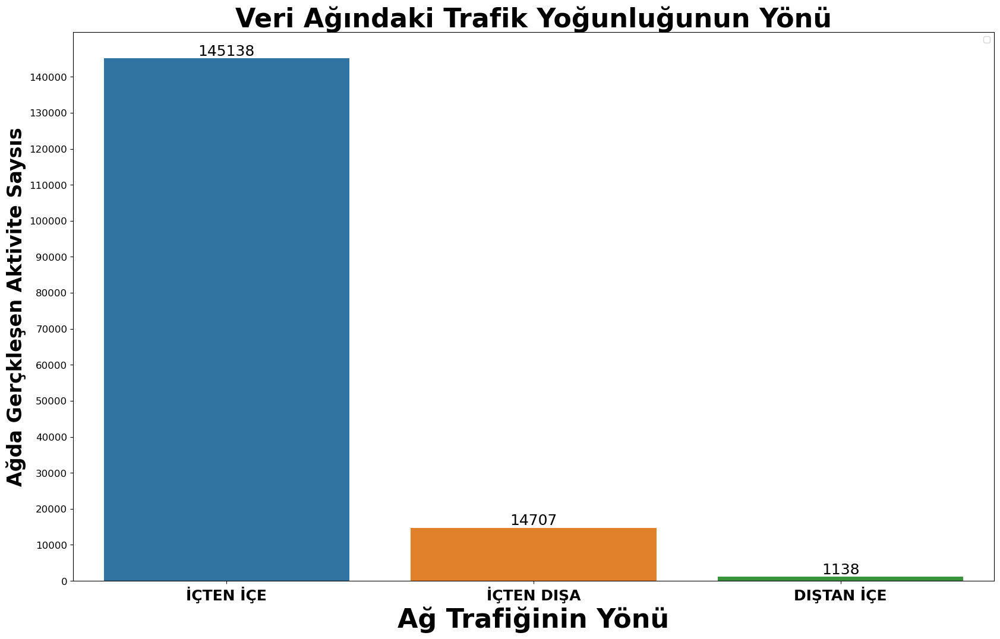

In [28]:
plt.figure(figsize = (20,12))
ax = sns.barplot(x = df['direction'].value_counts().index, y = df['direction'].value_counts().values, ci = None)
ax.bar_label(ax.containers[0], fontsize = 18)

plt.xlabel('Ağ Trafiğinin Yönü',fontsize = 32, fontweight = 'bold')
plt.xticks(fontsize =18,fontweight = 'bold')
plt.ylabel('Ağda Gerçkleşen Aktivite Saysıs',fontsize = 24, fontweight = 'bold')
plt.yticks(fontsize = 12)
ax.set_yticks(range(0,150000,10000))
plt.title('Veri Ağındaki Trafik Yoğunluğunun Yönü',fontsize = 32, fontweight = 'bold')
plt.legend(loc = 1)
plt.show()

In [ ]:
plt.figure(figsize = (20,12))
ax = sns.barplot(x = df['direction'].value_counts().index, y = df['direction'].value_counts().values, ci = None)
ax.bar_label(ax.containers[0], fontsize = 18)

plt.xlabel('Ağ Trafiğinin Yönü',fontsize = 32, fontweight = 'bold')
plt.xticks(fontsize =18,fontweight = 'bold')
plt.ylabel('Ağda Gerçkleşen Aktivite Saysıs',fontsize = 24, fontweight = 'bold')
plt.yticks(fontsize = 12)
ax.set_yticks(range(0,150000,10000))
plt.title('Veri Ağındaki Trafik Yoğunluğunun Yönü',fontsize = 32, fontweight = 'bold')
plt.legend(loc = 1)
plt.show()

In [ ]:
df.iloc[:,100:].info()

In [ ]:
df['bidirectional_bytes']

In [ ]:
df['application_name'].value_counts()

In [ ]:
list(df.columns)

In [ ]:
df['source_address'][df['login_fail_count']==1].value_counts()[:10]

In [ ]:
#Login failed destination addresses
df['destination_address'][df['login_fail_count']==1].value_counts()

In [ ]:
groupby_sourcemin = df.groupby(['source_address','minutes'])['minutes'].count().sort_values(ascending =False)
df_reset_sourcemin = groupby_sourcemin.reset_index(name = 'values')

In [ ]:
[df['login_fail_count']==1]

In [ ]:
.value_counts().reset_index(name='values')

In [ ]:
#
log_fail_sourdest_min = df[df['login_fail_count']==1].groupby(['source_address','destination_address','minutes'])['minutes'].count().sort_values(ascending = False)

In [ ]:
log_fail_sourdest_min[:10]

In [ ]:
log_fail_sourdest_min_reset = log_fail_sourdest_min.reset_index(name='count')

# Sort the DataFrame by the 'minutes' column
log_fail_sourdest_min_sorted = log_fail_sourdest_min_reset.sort_values(by=['count','minutes'], ascending=[False,True])

In [ ]:
log_fail_sourdest_min_sorted[:10] 

In [ ]:
df.groupby(['source_address','login_fail_count']).count().sort_index()

In [ ]:
#Login failed destinatioon  adresses
df['destination_address'][df['source_address'] == '10.1.78.24'].value_counts()

In [ ]:
#The top login login failed source adress 940 time attend to login top failed dsetination address
df['destination_address'][(df['source_address'] == '10.1.78.24')&(df['login_fail_count']==1)].value_counts()

In [ ]:
df[['source_address','destination_address']].isnull().sum()

In [ ]:
df['source_address'].value_counts(dropna =False)

In [ ]:
df.groupby(['source_address']).count().sort_values(by = 'sync_name', ascending = False)

In [ ]:
df['event_time'] = pd.to_datetime(df['event_time'])

In [ ]:
df['minute_second'] = df['event_time'].dt.strftime('%M:%S')

In [6]:
df['minutes'] = df.event_time.dt.minute

In [ ]:
df.groupby('minute_second')['source_address'].count().sort_values()

In [ ]:
sns.lineplot(df.groupby('minute_second')['source_address'].count())

In [ ]:
df[['source_address','destination_address']].count()

In [ ]:
dense_source  = df.groupby('source_address')['source_address'].count().sort_values(ascending=False)

In [ ]:
dense_source[dense_source.values>100].count()

In [ ]:
sns.barplot(x = df.groupby('source_address')['source_address'].count().index, y=df.groupby('source_address')['source_address'].count().values)

Öncelikle event_time sütunumuzu birimlerine ayırdığımızda bu datanın 18 Mart 2024 tarihine ait bir data oldugu
Veri trafiğinin bu tarihte saat 14 e ait olduğu görülmüştür.

In [ ]:
df['hour_of_day'].value_counts().sort_values(ascending=False)

In [ ]:
df.event_time.dt.year.value_counts()

In [ ]:
df.event_time.dt.month.value_counts()

In [ ]:
df.event_time.dt.day.value_counts()

In [ ]:
df.event_time.dt.hour.value_counts()

In [ ]:
df.event_time.dt.year.value_counts()

In [ ]:
df.event_time.dt.minute.value_counts().sort_index()

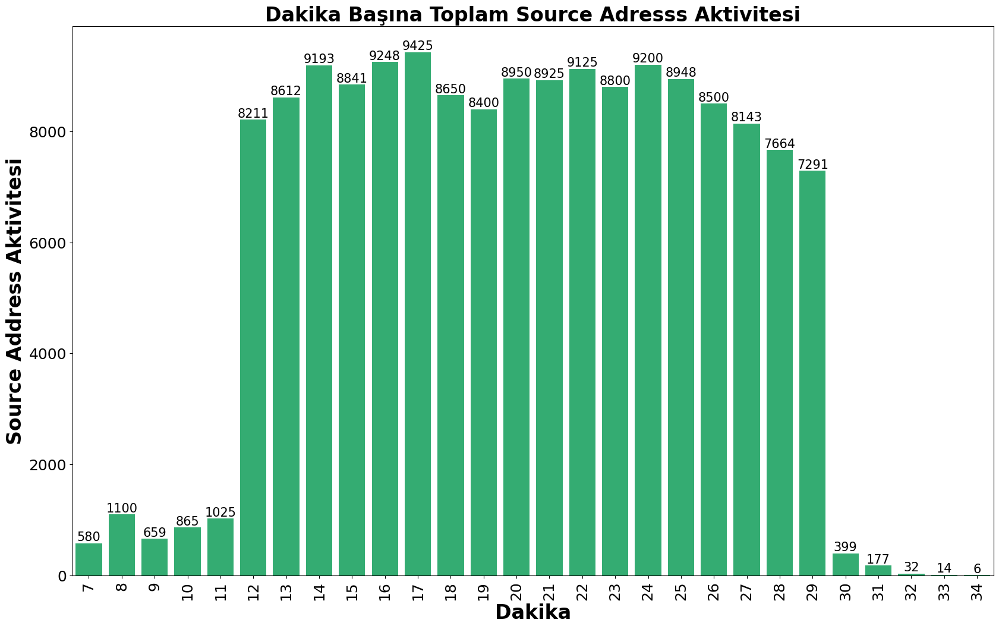

In [9]:
plt.figure(figsize = (20,12))
ax = sns.barplot(x = df['minutes'].value_counts().index, y = df['minutes'].value_counts().values,color = '#20c073')
ax.bar_label(ax.containers[0],fontsize = 15)
plt.xticks(rotation = 90,fontsize = 18)
plt.yticks(fontsize = 18)
plt.ylabel('Source Address Aktivitesi',fontsize=24,fontweight='bold')
plt.xlabel('Dakika',fontsize = 24,fontweight='bold')
plt.title('Dakika Başına Toplam Source Adresss Aktivitesi',fontsize = 24,fontweight='bold')
plt.show()

In [10]:
df.groupby('minutes')['source_address'].count()

minutes
7      580
8     1100
9      659
10     865
11    1025
12    8211
13    8612
14    9193
15    8841
16    9248
17    9425
18    8650
19    8400
20    8950
21    8925
22    9125
23    8800
24    9200
25    8948
26    8500
27    8143
28    7664
29    7291
30     399
31     177
32      32
33      14
34       6
Name: source_address, dtype: int64

In [ ]:
plt.figure(figsize = (12,8))
ax = sns.barplot(x = df.groupby('minutes')['destination_address'].count().index, y = df.groupby('minutes')['source_address'].count().values,color = '#20c073')
ax.bar_label(ax.containers[0],fontsize = 15)
plt.xticks(rotation = 90,fontsize = 18)
plt.yticks(fontsize = 18)
plt.ylabel('Aktivite Sayısı',fontsize=24,fontweight='bold')
plt.xlabel('Dakika',fontsize = 24,fontweight='bold')
plt.title('Dakika Başına Network Aktivitesi',fontsize = 24,fontweight='bold')
plt.show()

In [ ]:
plt.figure(figsize = (20,12))
ax = sns.barplot(x = df['minutes'].value_counts().index, y = df['minutes'].value_counts().values,color = '#20c073')
ax.bar_label(ax.containers[0],fontsize = 15)
plt.xticks(rotation = 90,fontsize = 18)
plt.yticks(fontsize = 18)
plt.ylabel('Aktivite Sayısı',fontsize=24,fontweight='bold')
plt.xlabel('Dakika',fontsize = 24,fontweight='bold')
plt.title('Dakika Başına Network Aktivitesi',fontsize = 24,fontweight='bold')
plt.show()

In [ ]:
plt.figure(figsize=(20, 12))
ax = sns.barplot(x=df['minutes'].value_counts().index, y=df['minutes'].value_counts().values, color='#20c073')
ax.bar_label(ax.containers[0], fontsize=15)

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90, fontsize=18)
plt.yticks(fontsize=18)
plt.ylabel('Aktivite Sayısı', fontsize=24, fontweight='bold')
plt.xlabel('Dakika', fontsize=24, fontweight='bold')
plt.title('Dakika Başına Network Aktivitesi', fontsize=24, fontweight='bold')

# Extract the top 20 data points from the grouped data
top_20 = df.groupby(['source_address', 'minutes'])['minutes'].count().sort_values(ascending=False).reset_index(name='count')[:20]

# Plot a line for each unique source_address
for source in top_20['source_address'].unique():
    source_data = top_20[top_20['source_address'] == source]
    plt.plot(source_data['minutes'], source_data['count'], marker='o', label=f'Source: {source}')

# Add a legend to differentiate the lines by source_address
plt.legend(fontsize=15)

# Show the plot
plt.show()

In [ ]:
plot = df.groupby(['source_address','minutes'])['minutes'].count().sort_values(ascending =False)[:100].reset_index(name='values')

In [ ]:
plot.reset_index(name='values')

In [ ]:
plt.figure(figsize = (20,12))
ax = sns.barplot(x = df['minutes'].value_counts().index, y = df['minutes'].value_counts().values,color = '#20c073')
ax.bar_label(ax.containers[0],fontsize = 15)
plt.xticks(rotation = 90,fontsize = 18)
plt.yticks(fontsize = 18)
plt.ylabel('Aktivite Sayısı',fontsize=24,fontweight='bold')
plt.xlabel('Dakika',fontsize = 24,fontweight='bold')
plt.title('Dakika Başına Network Aktivitesi',fontsize = 24,fontweight='bold')
for source in plot['source_address'].unique():
    source_data = plot[plot['source_address'] == source][:6]
    plt.plot(source_data['minutes'], source_data['values'], marker='o', label=f'Source: {source}')
plt.show()

In [ ]:
plt.figure(figsize = (20,12))
ax = sns.barplot(x = df['minutes'].sort_index().index, y = df.event_time.dt.minute.value_counts().sort_index().values,palette='viridis')
ax.bar_label(ax.containers[0])
plt.xticks(rotation = 90)
plt.show()

In [26]:
df['minutes'] = df.event_time.dt.minute

In [ ]:
df.groupby(['minutes','source_address'])['source_address'].count().sort_values(ascending =False)

In [ ]:
groupby_minsource = df.groupby(['minutes','source_address'])['source_address'].count().sort_index(ascending = False).sort_values(ascending =False)

In [ ]:
sns.lineplot(x = df['event_time'].)

In [48]:
df[['data_volume', 'bytes_sent', 'bytes_received']]

KeyError: "None of [Index(['data_volume', 'bytes_sent', 'bytes_received'], dtype='object')] are in the [columns]"

In [63]:
df_data_in_out = df.groupby(['source_address','destination_address','minutes'])[['src2dst_bytes','dst2src_bytes']].sum().sort_values(by = ['src2dst_bytes','dst2src_bytes'], ascending= False)[:50]/(1024*1024)

In [ ]:
groupby_minsource[groupby_minsource.values>10]

In [ ]:
groupby_minsource

In [11]:
groupby_sourcemin = df.groupby(['source_address','minutes'])['minutes'].count().sort_values(ascending =False)
groupby_destmin = df.groupby(['destination_address','minutes'])['minutes'].count().sort_values(ascending =False)
groupby_sourcedest = df.groupby(['source_address','destination_address','minutes'])['minutes'].count().sort_values(ascending =False)


df_reset_sourcemin = groupby_sourcemin.reset_index(name = 'values')
df_reset_destmin = groupby_destmin.reset_index(name = 'values')
df_reset_sourcedest = groupby_sourcedest.reset_index(name = 'values') 


In [12]:
groupby_destmin = df.groupby(['destination_address','minutes'])['minutes'].count().sort_values(ascending =False)

In [13]:
groupby_sourcedest = df.groupby(['source_address','destination_address','minutes'])['minutes'].count().sort_values(ascending =False)

source_address  destination_address  minutes
10.1.78.24      10.1.78.10           14         1051
10.1.68.100     10.10.101.10         26          942
                                     18          922
                                     24          890
                                     15          883
                                                ... 
10.10.111.11    192.168.63.45        18            1
                                     15            1
                                     12            1
                192.168.63.41        17            1
95.214.55.244   10.1.71.10           25            1
Name: minutes, Length: 14698, dtype: int64

In [15]:
df_reset_sourcemin = groupby_sourcemin.reset_index(name = 'values')

In [16]:
df_reset_destmin = groupby_destmin.reset_index(name = 'values')

In [17]:
df_reset_sourcedest = groupby_sourcedest.reset_index(name = 'values') 

,source_address,destination_address,minutes,values
0,10.1.78.24,10.1.78.10,14,1051
1,10.1.68.100,10.10.101.10,26,942
2,10.1.68.100,10.10.101.10,18,922
3,10.1.68.100,10.10.101.10,24,890
4,10.1.68.100,10.10.101.10,15,883
...,...,...,...,...
14693,10.10.111.11,192.168.63.45,18,1
14694,10.10.111.11,192.168.63.45,15,1
14695,10.10.111.11,192.168.63.45,12,1
14696,10.10.111.11,192.168.63.41,17,1


## df_sourcemin

In [ ]:
df_sourcemin.columns = ['source_address', 'minute', 'count']

In [ ]:
df_sourcemin

In [ ]:
sns.barplot(x = groupby_sourcemin[groupby_sourcemin.values>1000].index,y = groupby_sourcemin[groupby_sourcemin.values>1000].values)

In [ ]:
groupby_sourcemin[groupby_sourcemin.values>1000].values

In [ ]:
dfx = groupby_sourcemin[groupby_sourcemin.values > 1000].reset_index()

In [ ]:
groupby_sourcemin[groupby_sourcemin.values > 1000].reset_index_index()

In [12]:
df['login_fail_count']

0         0
1         0
2         0
3         0
4         0
         ..
160978    0
160979    0
160980    0
160981    0
160982    0
Name: login_fail_count, Length: 160983, dtype: int64

In [ ]:
df['login_fail_count'].value_counts()

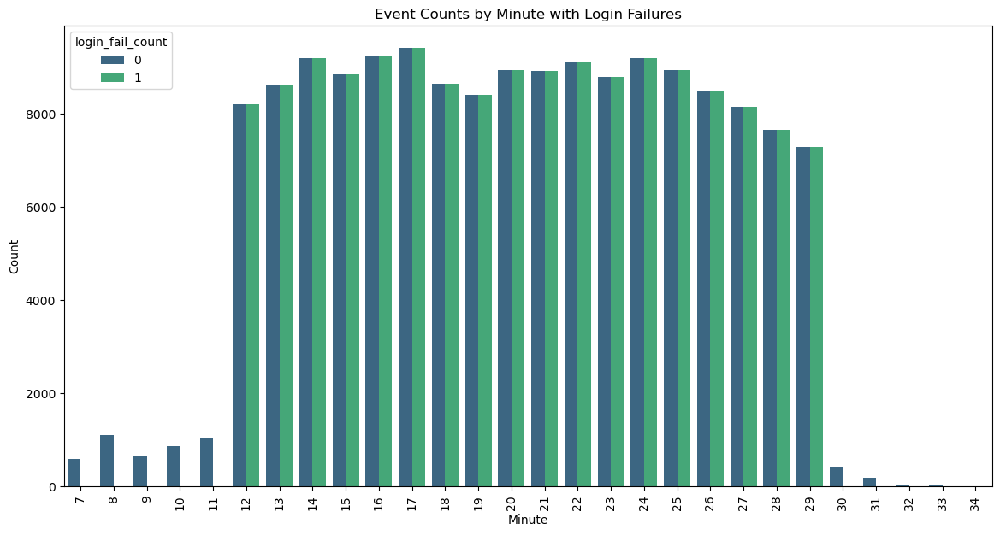

In [33]:
minute_counts = df['event_time'].dt.minute.value_counts().sort_index()

# Create a DataFrame with minute and corresponding counts
minute_df = pd.DataFrame({'minute': minute_counts.index, 'count': minute_counts.values})

# Merge this with the original DataFrame on the minute
df = df.merge(minute_df, left_on=df['event_time'].dt.minute, right_on='minute', how='left')

plt.figure(figsize=(14, 7))

# Create the bar plot
sns.barplot(x='minute', y='count', data=df, palette='viridis', hue='login_fail_count')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)

# Set plot title and labels
plt.title('Event Counts by Minute with Login Failures')
plt.xlabel('Minute')
plt.ylabel('Count')

# Display the plot
plt.show()


In [131]:
df[df['login_fail_count']==1].groupby(['source_address','minutes','login_fail_count'])['minutes'].count().reset_index(name = 'values').sort_values(by = 'values',ascending =False)

,source_address,minutes,login_fail_count,values
4,10.1.78.24,17,1,657
3,10.1.78.24,16,1,283
48,10.212.134.77,23,1,4
44,10.212.134.77,19,1,4
46,10.212.134.77,21,1,4
...,...,...,...,...
73,10.61.0.172,28,1,1
74,10.61.0.173,25,1,1
75,10.61.0.179,24,1,1
76,10.61.0.181,17,1,1


In [262]:
df['source_address']

0         192.168.2.100
1          10.10.10.140
2          10.10.92.254
3            10.1.66.11
4         10.10.107.254
              ...      
160978    10.10.100.100
160979    10.10.100.100
160980     10.110.10.42
160981    10.10.100.100
160982      10.1.68.100
Name: source_address, Length: 160983, dtype: object

In [263]:
df.groupby(['source_address','minutes','login_fail_count'])['minutes'].count().reset_index(name = 'values').sort_values(by = 'values',ascending =False)

KeyError: 'minutes'

C:\Users\manai\AppData\Local\Temp\ipykernel_4372\3602310864.py:3: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




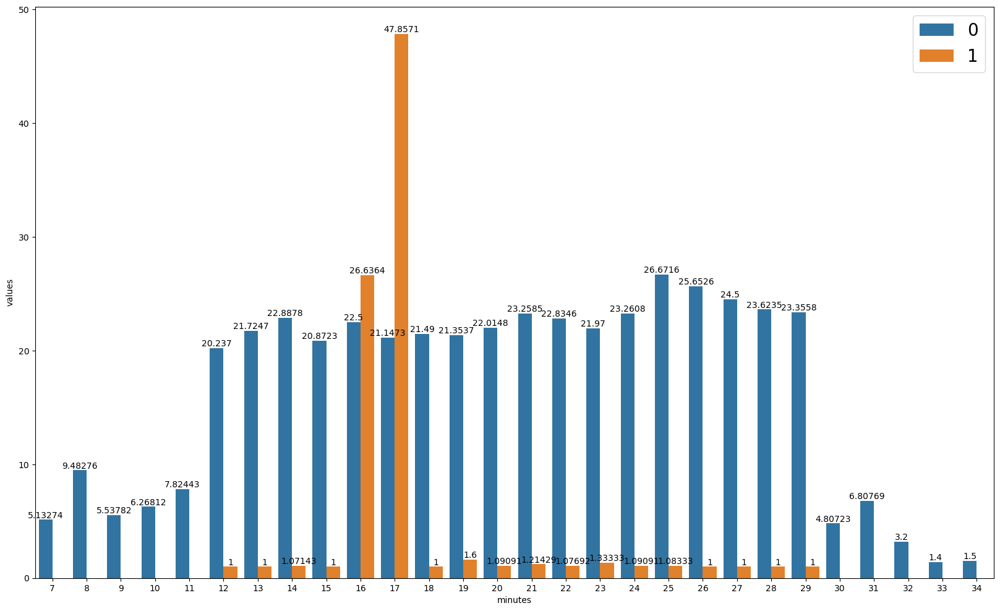

In [126]:
plt.figure(figsize = (20,12))

ax = sns.barplot(df.groupby(['source_address','minutes','login_fail_count'])['minutes'].count().reset_index(name = 'values').sort_values(by = 'values',ascending =False),
            x ='minutes',
            y = 'values',
           hue = 'login_fail_count',
           ci = None)

for container in ax.containers:
    ax.bar_label(container)

"""for container in ax.containers:
    ax.bar_label(container, rotation =70, padding=2)"""
    

    
plt.legend( loc = 1,fontsize =20)
plt.show()

C:\Users\manai\AppData\Local\Temp\ipykernel_4372\1492727881.py:11: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




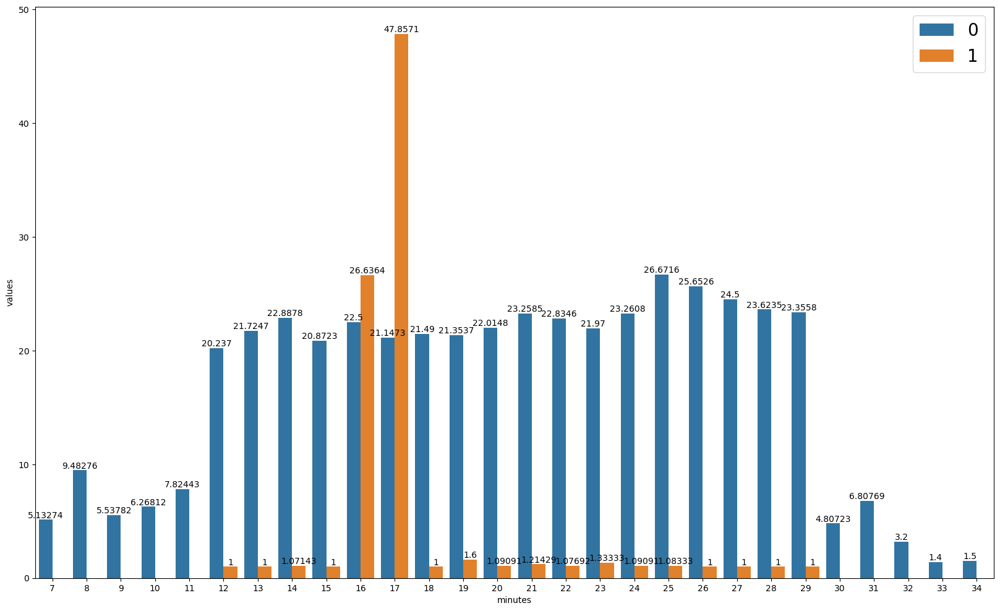

In [100]:
df[df['login_fail_count']==1]['login_fail_count'].count()

1145

In [193]:
df[df['login_fail_count']==1]['source_address'].value_counts()

10.1.78.24        940
10.212.134.77      20
10.81.0.122         2
192.168.30.184      2
10.110.10.38        2
                 ... 
192.168.30.123      1
10.61.0.145         1
10.110.10.26        1
10.81.0.132         1
10.110.10.28        1
Name: source_address, Length: 162, dtype: int64

In [107]:
df[['source_address','destination_address']][df['login_fail_count']==1].value_counts()

source_address   destination_address
10.1.78.24       10.1.78.10             940
10.212.134.77    10.1.78.12              20
10.61.1.55       10.10.111.11             2
185.246.128.133  10.1.71.10               2
10.110.10.66     10.10.111.11             2
                                       ... 
10.61.0.173      10.10.111.11             1
10.61.0.179      10.10.111.11             1
10.61.0.181      10.10.111.11             1
10.61.0.194      10.10.111.11             1
193.105.134.95   10.1.71.10               1
Length: 162, dtype: int64

In [ ]:
#filtering login fails and grouping by source_address
df[df['login_fail_count']==1][['source_address','minutes']].value_counts().reset_index(name = 'counts').sort_values(by=['counts','minutes'],ascending = False)


#filtering login fails and grouping by destination_address
df[df['login_fail_count']==1][['destination_address','minutes']].value_counts().reset_index(name = 'counts').sort_values(by=['counts','minutes'],ascending = False)


#Filtering login fails and grouping by source, destination addreses and minutes 
df[df['login_fail_count']==1][['source_address','destination_address','minutes']].value_counts().reset_index(name = 'counts').sort_values(by=['counts','minutes'],ascending = False)

In [105]:
df[df['login_fail_count']==1][['source_address','minutes']].value_counts().reset_index(name = 'counts').sort_values(by=['counts','minutes'],ascending = False)[:10]

,source_address,minutes,counts
0,10.1.78.24,17,657
1,10.1.78.24,16,283
2,10.212.134.77,23,4
4,10.212.134.77,21,4
3,10.212.134.77,19,4
5,10.212.134.77,25,2
8,10.212.134.77,24,2
7,10.212.134.77,22,2
6,10.212.134.77,20,2
9,10.61.0.121,14,2


In [106]:
df[df['login_fail_count']==1][['destination_address','minutes']].value_counts().reset_index(name = 'counts').sort_values(by=['counts','minutes'],ascending = False)[:10]

,destination_address,minutes,counts
0,10.1.78.10,17,657
1,10.1.78.10,16,283
2,10.10.111.11,14,14
4,10.10.111.11,21,13
3,10.10.111.11,12,13
6,10.10.111.11,17,12
5,10.10.111.11,15,12
8,10.10.111.11,25,11
9,10.10.111.11,22,11
7,10.10.111.11,18,11


In [104]:
df[df['login_fail_count']==1][['source_address','destination_address','minutes']].value_counts().reset_index(name = 'counts').sort_values(by=['counts','minutes'],ascending = False)

,source_address,destination_address,minutes,counts
0,10.1.78.24,10.1.78.10,17,657
1,10.1.78.24,10.1.78.10,16,283
2,10.212.134.77,10.1.78.12,23,4
4,10.212.134.77,10.1.78.12,21,4
3,10.212.134.77,10.1.78.12,19,4
...,...,...,...,...
165,10.1.78.20,10.1.78.22,12,1
168,10.61.1.55,10.10.111.11,12,1
169,10.61.0.203,10.10.111.11,12,1
172,10.61.0.186,10.10.111.11,12,1


In [7]:
df[df['login_fail_count']==1][['source_address','destination_address','minutes','application_category_name']].value_counts().reset_index(name = 'counts').sort_values(by=['counts','minutes'],ascending = False)

,source_address,destination_address,minutes,application_category_name,counts
0,10.1.78.24,10.1.78.10,17,System,657
1,10.1.78.24,10.1.78.10,16,System,283
2,10.212.134.77,10.1.78.12,23,RemoteAccess,4
4,10.212.134.77,10.1.78.12,21,RemoteAccess,4
3,10.212.134.77,10.1.78.12,19,RemoteAccess,4
...,...,...,...,...,...
165,10.1.78.20,10.1.78.22,12,System,1
168,10.61.1.55,10.10.111.11,12,Web,1
169,10.61.0.203,10.10.111.11,12,Web,1
172,10.61.0.186,10.10.111.11,12,Web,1


In [ ]:
df.appl

In [8]:
df[df['login_fail_count']==1][['source_address','destination_address','minutes','application_name']].value_counts().reset_index(name = 'counts').sort_values(by=['counts','minutes'],ascending = False)

,source_address,destination_address,minutes,application_name,counts
0,10.1.78.24,10.1.78.10,17,NetBIOS.SMBv23,657
1,10.1.78.24,10.1.78.10,16,NetBIOS.SMBv23,283
2,10.212.134.77,10.1.78.12,23,SSH,4
4,10.212.134.77,10.1.78.12,21,SSH,4
3,10.212.134.77,10.1.78.12,19,SSH,4
...,...,...,...,...,...
165,10.1.78.20,10.1.78.22,12,NetBIOS.SMBv23,1
168,10.61.1.55,10.10.111.11,12,HTTP,1
169,10.61.0.203,10.10.111.11,12,HTTP,1
172,10.61.0.186,10.10.111.11,12,HTTP,1


In [101]:
df[df['login_fail_count']==1][['destination_address','minutes']].value_counts().reset_index(name = 'counts').sort_values(by=['counts','minutes'],ascending = False)

,destination_address,minutes,counts
0,10.1.78.10,17,657
1,10.1.78.10,16,283
2,10.10.111.11,14,14
4,10.10.111.11,21,13
3,10.10.111.11,12,13
6,10.10.111.11,17,12
5,10.10.111.11,15,12
8,10.10.111.11,25,11
9,10.10.111.11,22,11
7,10.10.111.11,18,11


In [209]:
df[df['login_fail_count']==1].groupby(['source_address','destination_address'])[['source_address','destination_address']].count().reset_index()

ValueError: cannot insert destination_address, already exists

In [99]:
df[(df['login_fail_count']==1)][['source_address','minutes']].value_counts().sort_values(ascending=False)

source_address  minutes
10.1.78.24      17         657
                16         283
10.212.134.77   23           4
                19           4
                21           4
                          ... 
192.168.63.99   28           1
192.168.88.14   21           1
192.168.88.35   12           1
                15           1
193.105.134.95  23           1
Length: 193, dtype: int64

In [22]:
 groupby_sourcemin


source_address  minutes
10.1.68.100     26         1693
10.1.66.175     15         1688
                24         1666
                21         1651
                27         1649
                           ... 
10.61.0.130     19            1
10.61.0.135     20            1
                24            1
10.61.0.145     20            1
95.214.55.244   25            1
Name: minutes, Length: 7697, dtype: int64

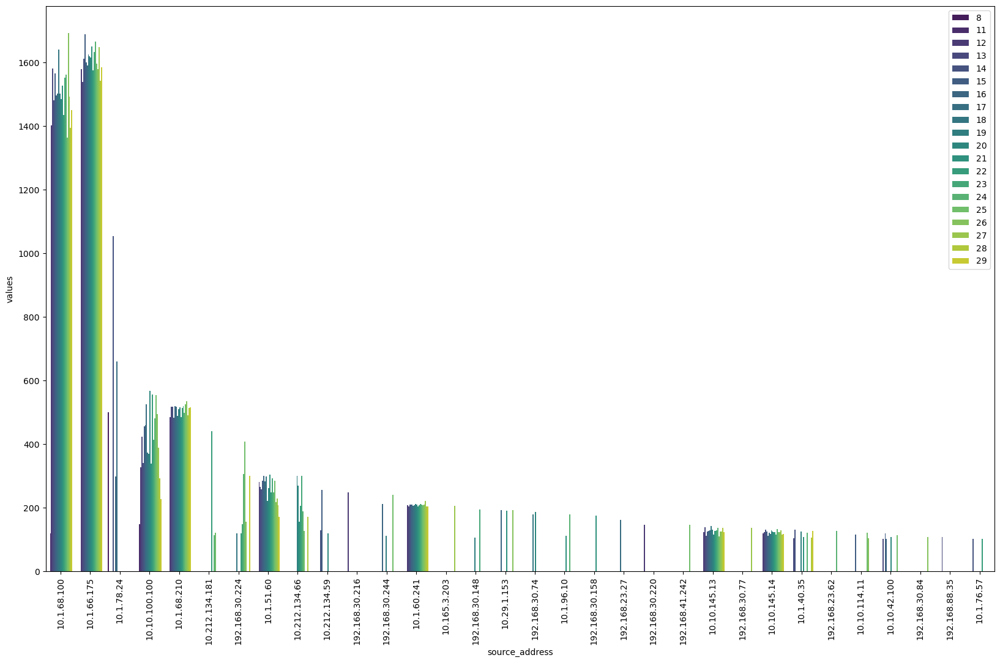

In [44]:

plt.figure(figsize= (20,12))
# Create the bar plot
sns.barplot(x='source_address', y='values', hue='minutes', data=df_reset[df_reset['values']>100], palette='viridis')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)
plt.legend(loc = 1)

# Show the plot
plt.show()

In [39]:
groupby_destmin = df.groupby(['destination_address','minutes'])['minutes'].count().sort_values(ascending =False)

In [40]:
df_reset_destmin = groupby_destmin.reset_index(name = 'values')

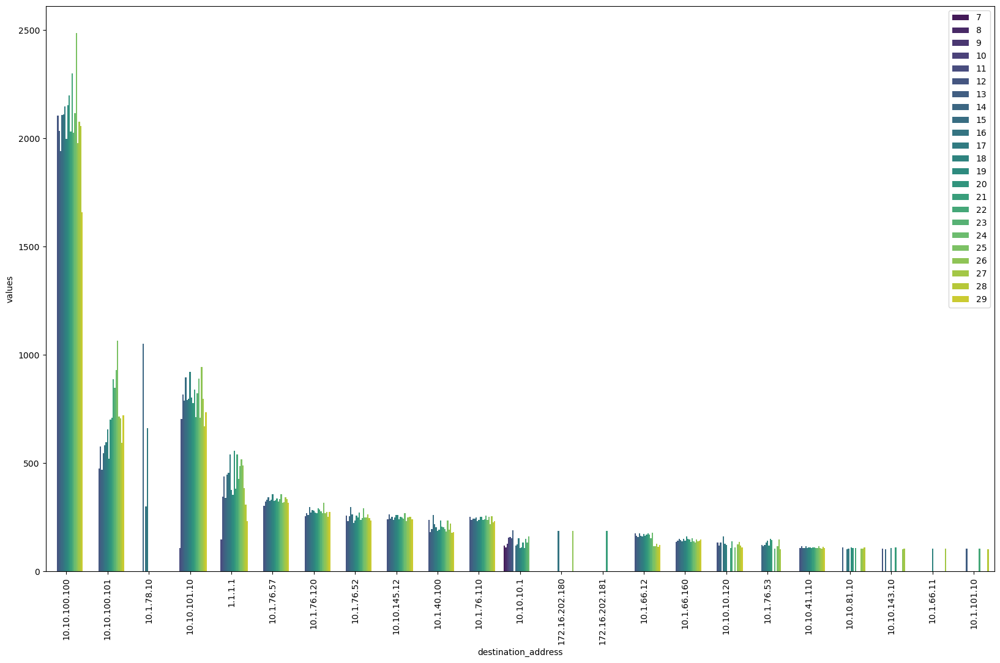

In [16]:
plt.figure(figsize= (20,12))
# Create the bar plot
sns.barplot(x='destination_address', y='values', hue='minutes', data=df_reset_destmin[df_reset_destmin['values']>100], palette='viridis')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)
plt.legend(loc = 1)

# Show the plot
plt.show()

In [31]:
df_reset = groupby_sourcemin.reset_index(name = 'values')

In [34]:
df_reset[df_reset['values']>100]

,source_address,minutes,values
0,10.1.68.100,26,1693
1,10.1.66.175,15,1688
2,10.1.66.175,24,1666
3,10.1.66.175,21,1651
4,10.1.66.175,27,1649
...,...,...,...
205,10.1.40.35,13,103
206,10.10.42.100,16,102
207,10.10.42.100,13,101
208,10.1.76.57,14,101


In [41]:
df_reset[df_reset['values']>100].nunique()

source_address     32
minutes            20
values            150
dtype: int64

In [20]:
df.groupby(['source_address','destination_address']).count()

sync_name  source_port  destination_port  \
source_address destination_address                                             
10.1.101.10    10.10.100.100               18           18                18   
               10.10.100.101               16           16                16   
               10.10.107.13                71           71                71   
               10.10.111.11                 3            3                 3   
10.1.40.100    10.1.40.1                    1            1                 1   
...                                       ...          ...               ...   
93.122.157.85  10.1.71.10                   3            3                 3   
93.190.8.77    10.1.71.10                   1            1                 1   
94.156.66.75   10.1.71.10                   1            1                 1   
95.101.23.205  10.1.96.10                   1            1                 1   
95.214.55.244  10.1.71.10                   1            1                 1   

                                    protocol  app_protocol  application_name  \
source_address destination_address                                             
10.1.101.10    10.10.100.100              18            18                18   
               10.10.100.101              16            16                16   
               10.10.107.13               71            71                71   
               10.10.111.11                3             3                 3   
10.1.40.100    10.1.40.1                   1             1                 1   
...                                      ...           ...               ...   
93.122.157.85  10.1.71.10                  3             3                 3   
93.190.8.77    10.1.71.10                  1             1                 1   
94.156.66.75   10.1.71.10                  1             1                 1   
95.101.23.205  10.1.96.10                  1             1                 1   
95.214.55.244  10.1.71.10                  1             1                 1   

                                    application_category_name  \
source_address destination_address                              
10.1.101.10    10.10.100.100                               18   
               10.10.100.101                               16   
               10.10.107.13                                71   
               10.10.111.11                                 3   
10.1.40.100    10.1.40.1                                    1   
...                                                       ...   
93.122.157.85  10.1.71.10                                   3   
93.190.8.77    10.1.71.10                                   1   
94.156.66.75   10.1.71.10                                   1   
95.101.23.205  10.1.96.10                                   1   
95.214.55.244  10.1.71.10                                   1   

                                    master_application_name  \
source_address destination_address                            
10.1.101.10    10.10.100.100                             18   
               10.10.100.101                             16   
               10.10.107.13                              71   
               10.10.111.11                               3   
10.1.40.100    10.1.40.1                                  1   
...                                                     ...   
93.122.157.85  10.1.71.10                                 3   
93.190.8.77    10.1.71.10                                 1   
94.156.66.75   10.1.71.10                                 1   
95.101.23.205  10.1.96.10                                 1   
95.214.55.244  10.1.71.10                                 1   

                                    tunnel_source_address  \
source_address destination_address                          
10.1.101.10    10.10.100.100                            0   
               10.10.100.101                            0   
               10.10.107.13                 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


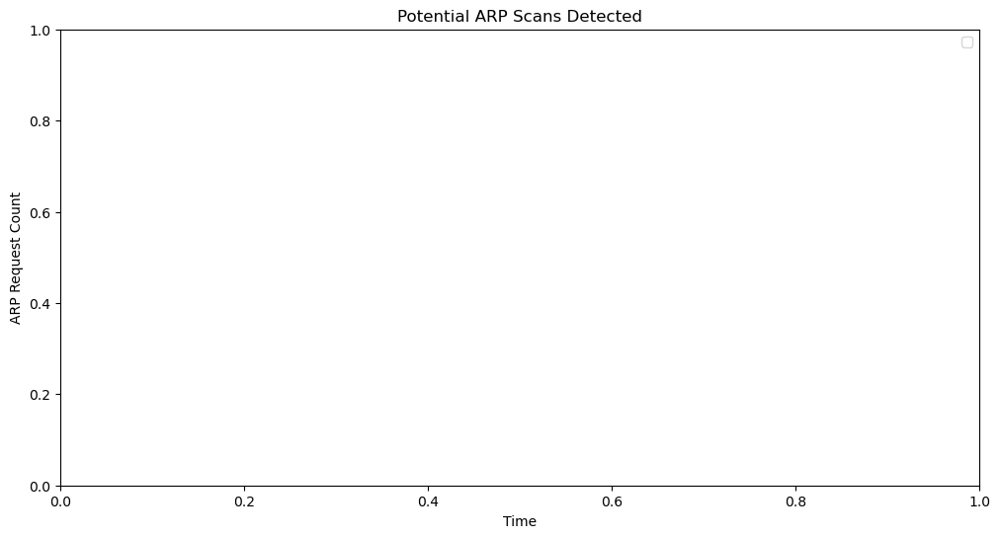

In [18]:
arp_traffic = df[df['protocol'] == 'ARP']

# Group by source address and time window to detect spikes in ARP requests
arp_counts = arp_traffic.groupby(['source_address', pd.Grouper(key='event_time', freq='1T')]).size().reset_index(name='arp_count')

# Identify sources with high ARP counts (threshold based on your network baseline)
threshold = 50
potential_scans = arp_counts[arp_counts['arp_count'] > threshold]

# Plot the ARP requests over time
plt.figure(figsize=(12, 6))
for source in potential_scans['source_address'].unique():
    source_data = potential_scans[potential_scans['source_address'] == source]
    plt.plot(source_data['event_time'], source_data['arp_count'], label=source)

plt.xlabel('Time')
plt.ylabel('ARP Request Count')
plt.title('Potential ARP Scans Detected')
plt.legend()
plt.show()

In [19]:
df[df['protocol'] == 'ARP'].value_counts()

Series([], dtype: int64)

In [20]:
import os

In [21]:
os.getcwd()

'C:\\Users\\Admin\\OneDrive\\Desktop\\TECHPRO\\GitPortf\\Portfolio\\ML\\Classification Models\\NextRay'

<AxesSubplot:xlabel='minutes', ylabel='values'>

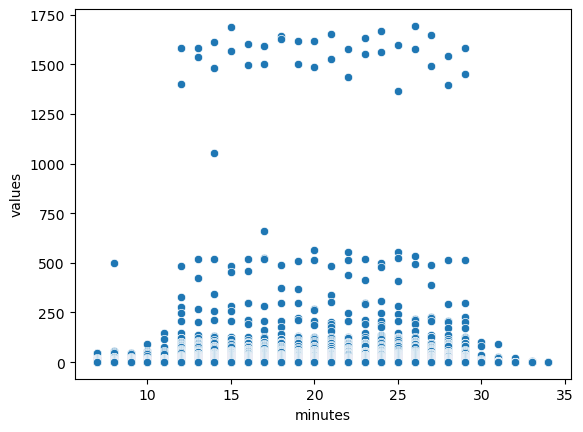

In [32]:
sns.scatterplot(data =df_reset, x = 'minutes',y = 'values' )

In [20]:
import plotly.express as px

In [14]:
groupby_sourcemin = df.groupby(['source_address','minutes'])['minutes'].count().sort_values(ascending =False)
groupby_destmin = df.groupby(['destination_address','minutes'])['minutes'].count().sort_values(ascending =False)
groupby_sourcedest = df.groupby(['source_address','destination_address','minutes'])['minutes'].count().sort_values(ascending =False)


df_reset_sourcemin = groupby_sourcemin.reset_index(name = 'values')
df_reset_destmin = groupby_destmin.reset_index(name = 'values')
df_reset_sourcedest = groupby_sourcedest.reset_index(name = 'values') 

In [19]:
fig = px.scatter(df_reset_sourcemin[df_reset_sourcemin['values']>400], 
                 x='minutes', 
                 y='values', 
                 size='values', 
                 color='source_address',
                 hover_name='source_address',  # Add hover information
                 title=('400 den Fazla Aktivitesi Olan Kaynak Adreslerin - Etkileşimli Balon Grafigi'),
                 labels={'minutes':'Minutes', 'values':'Values'},
                 size_max=25)  # Maximum size of bubbles
# Show the plot

fig.show()

<IPython.core.display.Javascript object>

In [21]:
fig = px.scatter(df_reset_destmin[df_reset_destmin['values']>400], 
                 x='minutes', 
                 y='values', 
                 size='values', 
                 color='destination_address',
                 hover_name='destination_address',  # Add hover information
                 title=('400 den Fazla Aktivitesi Olan Hedef Adreslerin - Etkileşimli Balon Grafigi'),
                 labels={'minutes':'Minutes', 'values':'Values'},
                 size_max=25)  # Maximum size of bubbles
# Show the plot

fig.show()

In [25]:
df_reset_sourcedest

,source_address,destination_address,minutes,values,source_dest_combo
0,10.1.78.24,10.1.78.10,14,1051,10.1.78.24 -->>>> 10.1.78.10
1,10.1.68.100,10.10.101.10,26,942,10.1.68.100 -->>>> 10.10.101.10
2,10.1.68.100,10.10.101.10,18,922,10.1.68.100 -->>>> 10.10.101.10
3,10.1.68.100,10.10.101.10,24,890,10.1.68.100 -->>>> 10.10.101.10
4,10.1.68.100,10.10.101.10,15,883,10.1.68.100 -->>>> 10.10.101.10
...,...,...,...,...,...
14693,10.10.111.11,192.168.63.45,18,1,10.10.111.11 -->>>> 192.168.63.45
14694,10.10.111.11,192.168.63.45,15,1,10.10.111.11 -->>>> 192.168.63.45
14695,10.10.111.11,192.168.63.45,12,1,10.10.111.11 -->>>> 192.168.63.45
14696,10.10.111.11,192.168.63.41,17,1,10.10.111.11 -->>>> 192.168.63.41


In [23]:
plt.figure(figsize = (30,16))
df_reset_sourcedest['source_dest_combo'] = df_reset_sourcedest['source_address'] + ' -->>>> ' + df_reset_sourcedest['destination_address']

# Step 2: Create the bubble chart with Plotly
fig = px.scatter(
    df_reset_sourcedest[df_reset_sourcedest['values']>150],
    x='minutes',
    y='values',
    size='values',  # Bubble size
    color='source_dest_combo',  # Color by source-destination combo
    hover_name='source_dest_combo',  # Show source-destination on hover
    title='Kaynaktan-->> Hedefe Trafik Yoğunluğu - Etkileşimli Balon grafiği ',
    labels={'source_dest_combo': 'Source -> Destination'},
)

# Show the plot
fig.show()

<Figure size 3000x1600 with 0 Axes>

In [247]:
df['sourceGeoPoint'][0]

"{''lat'': 40.92089, ''lon'': 29.31361}"

In [ ]:
fig = px.scatter_mapbox(df, lat='latitude', lon='longitude',
                        zoom=5, height=600)

# Set the mapbox style
fig.update_layout(mapbox_style="open-street-map")

In [ ]:
data = {'location': ["{''lat'': 40.92089, ''lon'': 29.31361}"]}

# Create DataFrame
df_latlon = pd.DataFrame(data)

# Function to extract lat and lon from the string
def extract_lat_lon(location_str):
    # Convert the string to a dictionary
    location_dict = ast.literal_eval(location_str.replace("''", "\""))
    # Extract latitude and longitude
    return location_dict['lat'], location_dict['lon']

# Apply the function to extract lat and lon and create new columns
df['latitude'], df['longitude'] = zip(*df['location'].apply(extract_lat_lon))

In [249]:
import ast

def extract_lat_lon(location_str):
    # Convert the string to a dictionary
    location_dict = ast.literal_eval(location_str.replace("''", "\""))
    # Extract latitude and longitude
    return location_dict['lat'], location_dict['lon']

# Apply the function to extract lat and lon, and create new columns
df['latitude'], df['longitude'] = zip(*df['sourceGeoPoint'].apply(extract_lat_lon))
print(df)

          sync_name source_address destination_address  source_port  \
0       master-node  192.168.2.100         192.168.0.1            0   
1       master-node   10.10.10.140          10.10.10.1            0   
2       master-node   10.10.92.254         10.10.92.22            0   
3       master-node     10.1.66.11          10.1.66.12            0   
4       master-node  10.10.107.254        10.10.107.11            0   
...             ...            ...                 ...          ...   
160978  master-node  10.10.100.100             1.1.1.1        62255   
160979  master-node  10.10.100.100             1.1.1.1        56538   
160980  master-node   10.110.10.42       10.10.100.100            0   
160981  master-node  10.10.100.100             1.1.1.1        56642   
160982  master-node    10.1.68.100        10.10.101.10        43268   

        destination_port  protocol  app_protocol  application_name  \
0                      0         0          1000       ARP-Request   
1      

In [255]:
df['source_lat']

0    40.92089
1    41.00820
Name: source_lat, dtype: float64

In [251]:
import plotly.express as px
import plotly.graph_objects as go

# Create a Plotly map
fig = go.Figure(go.Scattermapbox(
    lat=df['latitude'],
    lon=df['longitude'],
    mode='markers',
    marker=dict(size=10, color='red'),
    text=df.index,  # Optional: text labels for each point
))

# Update the layout for the map
fig.update_layout(
    mapbox=dict(
        style="open-street-map",  # Use OpenStreetMap as the base map style
        center=dict(lat=df['latitude'].mean(), lon=df['longitude'].mean()),
        zoom=12
    ),
    title="Map of Coordinates",
    showlegend=False
)

# Show the map
fig.show()

In [252]:
data = {
    'sourceGeoPoint': ["{''lat'': 40.92089, ''lon'': 29.31361}", "{''lat'': 41.0082, ''lon'': 28.9784}"],
    'destinationGeoPoint': ["{''lat'': 40.73061, ''lon'': -73.935242}", "{''lat'': 34.052235, ''lon'': -118.243683}"],
    'traffic_volume': [100, 200]
}
df = pd.DataFrame(data)

# Function to extract latitude and longitude from the string
def extract_lat_lon(location_str):
    location_dict = ast.literal_eval(location_str.replace("''", "\""))
    return location_dict['lat'], location_dict['lon']

# Extract lat and lon for both source and destination
df['source_lat'], df['source_lon'] = zip(*df['sourceGeoPoint'].apply(extract_lat_lon))
df['dest_lat'], df['dest_lon'] = zip(*df['destinationGeoPoint'].apply(extract_lat_lon))


import plotly.graph_objects as go

# Create the map
fig = go.Figure()

# Add source points
fig.add_trace(go.Scattermapbox(
    lat=df['source_lat'],
    lon=df['source_lon'],
    mode='markers',
    marker=dict(size=10, color='blue'),
    text=df['traffic_volume'],  # Optional: show traffic volume
    name='Source'
))

# Add destination points
fig.add_trace(go.Scattermapbox(
    lat=df['dest_lat'],
    lon=df['dest_lon'],
    mode='markers',
    marker=dict(size=10, color='red'),
    text=df['traffic_volume'],  # Optional: show traffic volume
    name='Destination'
))

# Update layout for map style
fig.update_layout(
    mapbox=dict(
        style="open-street-map",
        center=dict(lat=df[['source_lat', 'dest_lat']].mean().mean(), lon=df[['source_lon', 'dest_lon']].mean().mean()),
        zoom=5
    ),
    title="Network Traffic Map",
    showlegend=True
)

# Show the map
fig.show()


In [ ]:
""

In [15]:
df['src2dst_bytes'] = round(df['src2dst_bytes']/(1024*1024),2)

In [16]:
df['dst2src_bytes'] = round(df['dst2src_bytes']/(1024*1024),2)

In [17]:
df['bidirectional_bytes'] = round(df['bidirectional_bytes']/(1024*1024),2)

In [18]:
df.rename({'bidirectional_bytes':'bidirectional_GBytes','src2dst_bytes':'src2dst_GBytes','dst2src_bytes':'dst2src_GBytes'},axis  =1 , inplace =True)

In [30]:
df_transfer = df[['source_address',"destination_address",'bidirectional_GBytes','src2dst_GBytes','dst2src_GBytes','minutes']].sort_values(by = 'src2dst_GBytes', ascending = False )

In [31]:
df_transfer.groupby(['source_address','minutes'])['src2dst_GBytes'].sum().sort_values(ascending= False)[:10].reset_index(name = 'Upload GB')

,source_address,minutes,Upload GB
0,10.1.40.30,28,2573.47
1,10.1.76.110,20,89.81
2,10.1.76.110,15,87.35
3,10.1.76.110,25,84.28
4,10.10.89.10,28,38.34
5,10.10.111.12,26,23.39
6,10.10.89.10,23,23.27
7,10.10.89.10,22,22.47
8,10.10.111.10,29,21.33
9,10.10.92.110,18,20.81


In [32]:
df_transfer.groupby(['source_address','destination_address','minutes'])['src2dst_GBytes'].sum().sort_values(ascending= False)[:20].reset_index(name = 'Upload GB')

,source_address,destination_address,minutes,Upload GB
0,10.1.40.30,10.1.40.22,28,2573.47
1,10.1.76.110,10.1.39.10,20,89.81
2,10.1.76.110,10.1.39.10,15,87.35
3,10.1.76.110,10.1.39.10,25,84.28
4,10.10.89.10,10.10.89.5,28,38.33
5,10.10.89.10,10.10.89.5,23,23.27
6,10.10.89.10,10.10.89.5,22,22.47
7,10.10.111.12,10.10.130.13,26,21.80
8,10.10.92.110,10.10.92.22,18,20.81
9,10.10.111.10,10.10.111.12,29,19.80


In [33]:
df_transfer.groupby(['source_address','destination_address','minutes'])['dst2src_GBytes'].sum().sort_values(ascending= False)[:20].reset_index(name = 'Download GB')

,source_address,destination_address,minutes,Download GB
0,10.1.40.35,10.1.40.22,14,1696.44
1,10.10.40.17,10.1.40.35,16,1480.43
2,10.1.40.35,10.1.40.22,19,805.50
3,10.1.40.35,10.1.40.22,29,702.97
4,10.10.40.17,10.1.40.35,21,517.70
5,10.1.40.35,10.1.40.22,24,486.15
6,10.10.89.10,10.10.89.5,28,338.81
7,10.10.40.17,10.1.40.35,26,332.45
8,10.10.89.10,10.10.89.5,27,299.13
9,10.10.89.10,10.10.89.5,23,168.92


In [248]:
df_transfer.groupby(['source_address','destination_address','minutes'])['bidirectional_GBytes'].sum().sort_values(ascending= False)[:20].reset_index(name = 'Total Transfer GB')

,source_address,destination_address,minutes,Total Transfer GB
0,10.1.40.30,10.1.40.22,28,2573.47
1,10.1.40.35,10.1.40.22,14,1696.59
2,10.10.40.17,10.1.40.35,16,1480.46
3,10.1.40.35,10.1.40.22,19,805.57
4,10.1.40.35,10.1.40.22,29,703.07
5,10.10.40.17,10.1.40.35,21,517.71
6,10.1.40.35,10.1.40.22,24,486.22
7,10.10.89.10,10.10.89.5,28,377.14
8,10.10.40.17,10.1.40.35,26,332.46
9,10.10.89.10,10.10.89.5,27,314.20


In [201]:
'bidirectional_GBytes'

'bidirectional_GBytes'

In [168]:
df_transfer = df_transfer.drop('bidirectional_GBytes',axis=1)

In [165]:
df_transfer.groupby(['source_address','minutes'])['src2dst_GBytes'].sum().sort_values(ascending= False)[:10].reset_index(name = 'Upload GB')

,source_address,minutes,Upload GB
0,10.1.40.30,28,2573.47
1,10.1.76.110,20,89.81
2,10.1.76.110,15,87.35
3,10.1.76.110,25,84.28
4,10.10.89.10,28,38.34
5,10.10.111.12,26,23.39
6,10.10.89.10,23,23.27
7,10.10.89.10,22,22.47
8,10.10.111.10,29,21.33
9,10.10.92.110,18,20.81


In [208]:
data = pd.read_csv(r'C:\Users\manai\Desktop\NextRay\ds_mulakat.csv')
df['event_time'] = pd.to_datetime(df['event_time'])
df['minutes'] = df.event_time.dt.minute

C:\Users\manai\AppData\Local\Temp\ipykernel_9528\2134586774.py:1: DtypeWarning:

Columns (102,116) have mixed types. Specify dtype option on import or set low_memory=False.



In [210]:
df =data

In [222]:
df['event_time'] = pd.to_datetime(df['event_time'])
df['minutes'] = df.event_time.dt.minute

In [241]:
df_transfer.groupby(['source_address','destination_address'])['destination_address'].count().sort_values(ascending = False)[:20]

source_address  destination_address
10.1.68.100     10.10.101.10           14647
10.10.100.100   1.1.1.1                 7768
10.1.66.175     10.1.76.57              5964
                10.1.76.120             4932
10.1.51.60      10.10.100.100           4669
10.1.66.175     10.1.76.52              4571
                10.1.76.110             4381
10.1.60.241     10.10.100.100           3763
10.1.66.175     10.1.66.160             2563
10.10.145.13    10.10.145.12            2279
10.10.145.14    10.10.145.12            2202
10.1.66.175     10.1.66.12              2145
10.1.78.24      10.1.78.10              2057
10.1.68.210     10.10.41.110            1961
10.212.134.66   10.10.100.100           1937
10.1.68.100     10.10.81.10             1839
192.168.30.224  10.10.100.101           1799
10.10.114.11    10.10.100.100           1787
10.10.42.100    10.1.40.100             1766
10.1.68.100     10.10.143.10            1764
Name: destination_address, dtype: int64

In [244]:
df.groupby(['source_address','destination_address'])['destination_address'].count().sort_values(ascending = False)[:20]

source_address  destination_address
10.1.68.100     10.10.101.10           14647
10.10.100.100   1.1.1.1                 7768
10.1.66.175     10.1.76.57              5964
                10.1.76.120             4932
10.1.51.60      10.10.100.100           4669
10.1.66.175     10.1.76.52              4571
                10.1.76.110             4381
10.1.60.241     10.10.100.100           3763
10.1.66.175     10.1.66.160             2563
10.10.145.13    10.10.145.12            2279
10.10.145.14    10.10.145.12            2202
10.1.66.175     10.1.66.12              2145
10.1.78.24      10.1.78.10              2057
10.1.68.210     10.10.41.110            1961
10.212.134.66   10.10.100.100           1937
10.1.68.100     10.10.81.10             1839
192.168.30.224  10.10.100.101           1799
10.10.114.11    10.10.100.100           1787
10.10.42.100    10.1.40.100             1766
10.1.68.100     10.10.143.10            1764
Name: destination_address, dtype: int64

In [245]:
df['protocol'] 

0          0
1          0
2          0
3          0
4          0
          ..
160978    17
160979    17
160980     1
160981    17
160982     6
Name: protocol, Length: 160983, dtype: int64

In [250]:
df.groupby(['source_address','destination_address','protocol','minutes'])['bidirectional_GBytes'].sum().sort_values(ascending= False)[:20].reset_index(name = 'Total Transfer GB')

,source_address,destination_address,protocol,minutes,Total Transfer GB
0,10.1.40.30,10.1.40.22,6,28,2573.47
1,10.1.40.35,10.1.40.22,6,14,1696.59
2,10.10.40.17,10.1.40.35,6,16,1480.46
3,10.1.40.35,10.1.40.22,6,19,805.57
4,10.1.40.35,10.1.40.22,6,29,703.07
5,10.10.40.17,10.1.40.35,6,21,517.71
6,10.1.40.35,10.1.40.22,6,24,486.22
7,10.10.89.10,10.10.89.5,6,28,377.14
8,10.10.40.17,10.1.40.35,6,26,332.46
9,10.10.89.10,10.10.89.5,6,27,314.20


In [251]:
df['protocol'].value_counts()

6      90894
17     58185
0      11478
1        414
2          6
112        6
Name: protocol, dtype: int64

In [11]:
df.groupby(['source_address','source_type','minutes'])['minutes'].count().sort_values(ascending =False)

source_address  source_type  minutes
10.1.68.100     INTERNAL     26         1693
10.1.66.175     INTERNAL     15         1688
                             24         1666
                             21         1651
                             27         1649
                                        ... 
10.61.0.130     INTERNAL     19            1
10.61.0.135     INTERNAL     20            1
                             24            1
10.61.0.145     INTERNAL     20            1
95.214.55.244   EXTERNAL     25            1
Name: minutes, Length: 7697, dtype: int64

In [12]:
df[(df['login_fail_count']==1)][['source_address','minutes']].value_counts().sort_values(ascending=False)

source_address  minutes
10.1.78.24      17         657
                16         283
10.212.134.77   23           4
                19           4
                21           4
                          ... 
192.168.63.99   28           1
192.168.88.14   21           1
192.168.88.35   12           1
                15           1
193.105.134.95  23           1
Length: 193, dtype: int64

In [14]:
df[(df['login_fail_count']==1)][['source_address','source_type','direction','minutes']].value_counts().sort_values(ascending=False)

source_address  source_type  direction          minutes
10.1.78.24      INTERNAL     INTERNAL2INTERNAL  17         657
                                                16         283
10.212.134.77   INTERNAL     INTERNAL2INTERNAL  23           4
                                                19           4
                                                21           4
                                                          ... 
192.168.63.99   INTERNAL     INTERNAL2INTERNAL  28           1
192.168.88.14   INTERNAL     INTERNAL2INTERNAL  21           1
192.168.88.35   INTERNAL     INTERNAL2INTERNAL  12           1
                                                15           1
193.105.134.95  EXTERNAL     EXTERNAL2INTERNAL  23           1
Length: 193, dtype: int64

In [22]:
df.columns.to_list()

['sync_name',
 'source_address',
 'destination_address',
 'source_port',
 'destination_port',
 'protocol',
 'app_protocol',
 'application_name',
 'application_category_name',
 'master_application_name',
 'tunnel_source_address',
 'tunnel_destination_address',
 'source_mac',
 'destination_mac',
 'tunnel_value',
 'package_count',
 'login_fail_count',
 'login_success',
 'expiration_id',
 'drop_eligible',
 'priority',
 'vlan_identifier',
 'event_time',
 'bidirectional_first_seen_ms',
 'bidirectional_last_seen_ms',
 'bidirectional_duration_ms',
 'bidirectional_GBytes',
 'bidirectional_max_piat_ms',
 'bidirectional_max_ps',
 'bidirectional_mean_piat_ms',
 'bidirectional_mean_ps',
 'bidirectional_min_piat_ms',
 'bidirectional_min_ps',
 'bidirectional_packets',
 'bidirectional_stddev_piat_ms',
 'bidirectional_stddev_ps',
 'bidirectional_syn_packets',
 'bidirectional_cwr_packets',
 'bidirectional_ece_packets',
 'bidirectional_urg_packets',
 'bidirectional_ack_packets',
 'bidirectional_psh_packe

In [23]:
df['DNS'].value_counts()

{''large_package_count'': 0, ''dns_query_count'': 0, ''bidirectional_max_query_len'': 0}      108291
{''large_package_count'': 0, ''dns_query_count'': 0, ''bidirectional_max_query_len'': 15}       3991
{''large_package_count'': 0, ''dns_query_count'': 0, ''bidirectional_max_query_len'': 26}       3299
{''large_package_count'': 0, ''dns_query_count'': 0, ''bidirectional_max_query_len'': 17}       3254
{''large_package_count'': 0, ''dns_query_count'': 0, ''bidirectional_max_query_len'': 24}       3149
                                                                                               ...  
{''large_package_count'': 0, ''dns_query_count'': 14, ''bidirectional_max_query_len'': 54}         1
{''large_package_count'': 0, ''dns_query_count'': 4, ''bidirectional_max_query_len'': 20}          1
{''large_package_count'': 0, ''dns_query_count'': 8, ''bidirectional_max_query_len'': 26}          1
{''large_package_count'': 1, ''dns_query_count'': 1, ''bidirectional_max_query_len'': 83}  

In [16]:
df[df['source_address']=='10.1.78.24']['status'].value_counts(dropna=False)

NaN                        2532
503 Service Unavailable       8
404 Not Found                 8
400 Bad Request               6
200                           5
404                           5
404 Object Not Found          4
400                           1
Name: status, dtype: int64

In [14]:
df[df['source_address']=='10.1.78.24'].count()

sync_name                 2569
source_address            2569
destination_address       2569
source_port               2569
destination_port          2569
                          ... 
session_id_from_time      2569
protocol_name             2569
source_asset_type            0
destination_asset_type       0
minutes                   2569
Length: 166, dtype: int64